In [2]:
pip install torch

     |████████████████████████████████| 881.9 MB 7.8 kB/s eta 0:00:016     |████████                        | 220.8 MB 10.7 MB/s eta 0:01:02     |█████████                       | 245.1 MB 1.4 MB/s eta 0:07:30
Note: you may need to restart the kernel to use updated packages.


In [2]:
# !pip uninstall opencv-python
!pip install opencv-python==4.0.0.21

     |████████████████████████████████| 25.4 MB 2.3 MB/s eta 0:00:011


In [3]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
from random import sample

In [4]:
chess = "/home/mihail/Downloads/1.0.3"

In [5]:
from glob import glob

In [6]:
files = glob(f"{chess}/images/*")

In [107]:
annotations = [f"{chess}/parrots_bbox.json"]

In [108]:
annotations

['/home/mihail/Downloads/1.0.3/parrots_bbox.json']

In [109]:
import json
import numpy as np
import os

from PIL import Image as PILImage
from PIL import ImageDraw as PILImageDraw

In [110]:
plt.rcParams["figure.figsize"] = (20,10)

In [121]:
class ChessDataset():
    def __init__(self, annotation_path, image_dir):
        self.annotation_path = annotation_path
        self.image_dir = image_dir

        with open(self.annotation_path) as json_file:
          self.coco = json.load(json_file)
        
        self.process_categories()
        self.process_images()
        self.process_segmentations()
    
    def display_image(self, image_id):
        print('Image:')
        print('======')

        image = self.images[image_id]            
        image_path = os.path.join(self.image_dir, image['file_name'])
        image = PILImage.open(image_path)

        im_arr = np.asarray(image)
        # convert rgb array to opencv's bgr format
        im_arr_bgr = cv2.cvtColor(im_arr, cv2.COLOR_RGB2BGR)
        
        for instance in self.segmentations[image_id]:
            PILImageDraw.Draw(image).rectangle((tuple(instance["bbox"][0]), tuple(instance["bbox"][1])), outline=1, fill=(223,223,223))
            PILImageDraw.Draw(image).polygon(instance["segmentation"], outline=1, fill=(123,123,213))

        im = PILImage.fromarray(np.asarray(image))
        plt.imshow(im)



    def show_laplacian(self, image_id):

      image = self.images[image_id]            
      image_path = os.path.join(self.image_dir, image['file_name'])

      # Load the image in greyscale
      img = cv2.imread(image_path,0)
      
      # Apply Gaussian Blur
      blur = cv2.GaussianBlur(img,(3,3),0)
      
      # Apply Laplacian operator in some higher datatype
      laplacian = cv2.Laplacian(blur,cv2.CV_64F)
      
      from google.colab.patches import cv2_imshow
      cv2_imshow(laplacian)

    def process_categories(self):
        self.categories = {}
        for category in self.coco['categories']:
            cat_id = category['id']
            
            # Add category to the categories dict
            if cat_id not in self.categories:
                self.categories[cat_id] = category
            else:
                print("ERROR: Skipping duplicate category id: {}".format(category))

                
    def process_images(self):
        self.images = {}
        for image in self.coco['images']:
            image_name = image['id']
            if image_name in self.images:
                print("Skip duplicates")
            else:
                self.images[image_name] = image
                
    def process_segmentations(self):
        self.segmentations = {}
        for segmentation in self.coco['annotations']:
            image_id = segmentation['image_id']
            if image_id not in self.segmentations:
                self.segmentations[image_id] = []
            self.segmentations[image_id].append(segmentation)

Visualize images and labels, given an image id.
Visualize the Laplacian transformation.

In [130]:
for k, v in chess_dataset.images.items():
    if v["file_name"] == "00002971.jpg":
        print(k)

1463


In [122]:
chess_dataset = ChessDataset(annotations[0], f"{chess}/images/")

Image:


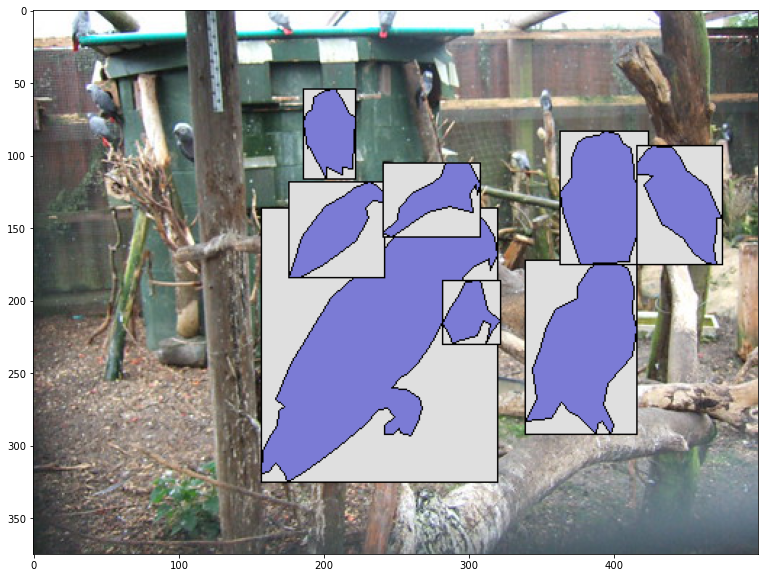

In [131]:
chess_dataset.display_image(1463)

In [ ]:
# chess_dataset.show_laplacian(20)

In [ ]:
data = pd.DataFrame(index=range(2870), columns=["image_id", "split", "category", "area", "x", "y", "width", "height"])

idx = 0
for dataset in ["train", "valid", "test"]:
  annotation_path = f'drive/MyDrive/Chess Pieces/{dataset}/_annotations.coco.json'
  image_dir = f'drive/MyDrive/Chess Pieces/{dataset}'
  chess_dataset = ChessDataset(annotation_path, image_dir)
  
  for bbox in chess_dataset.coco['annotations']:
    data.iloc[idx] = [bbox["image_id"], dataset, bbox["category_id"], bbox["area"], bbox["bbox"][0], bbox["bbox"][1], bbox["bbox"][2], bbox["bbox"][3]]
    idx+=1

categories = {item["id"]:item["name"] for item in chess_dataset.coco['categories']}
data["category"] = data.category.map(categories)

In [ ]:
data.groupby(["split", "category"]).size()

split  category    
test   black-bishop     21
       black-king       17
       black-knight     25
       black-pawn       86
       black-queen      14
       black-rook       26
       white-bishop     25
       white-king       15
       white-knight     25
       white-pawn       88
       white-queen      14
       white-rook       20
train  bishop            1
       black-bishop     97
       black-king      101
       black-knight    141
       black-pawn      496
       black-queen      62
       black-rook      147
       white-bishop    125
       white-king      105
       white-knight    140
       white-pawn      474
       white-queen      81
       white-rook      138
valid  black-bishop     22
       black-king       29
       black-knight     30
       black-pawn       77
       black-queen      11
       black-rook       28
       white-bishop     22
       white-king       29
       white-knight     19
       white-pawn       77
       white-queen      16
       w

Visualize the bounding box area per category per dataset (train/val/test)

category: black-rook, dataset: train


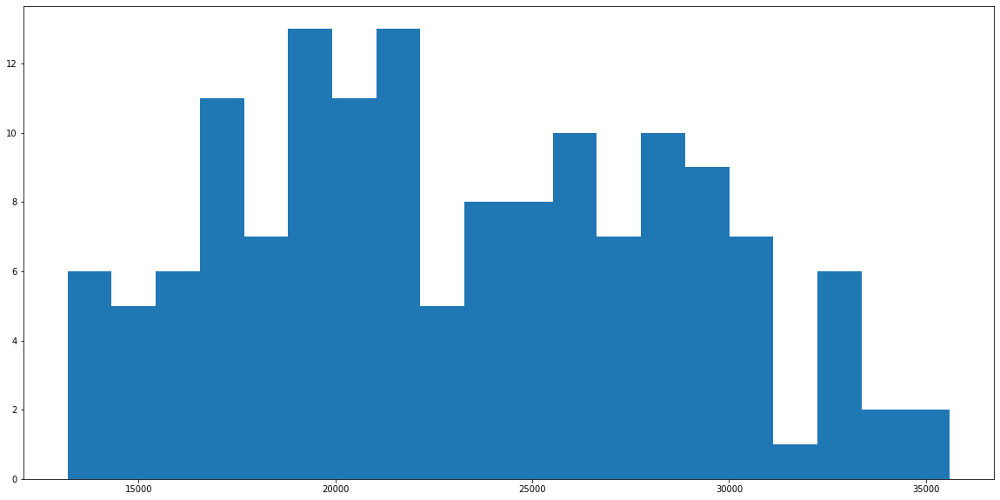

category: white-king, dataset: train


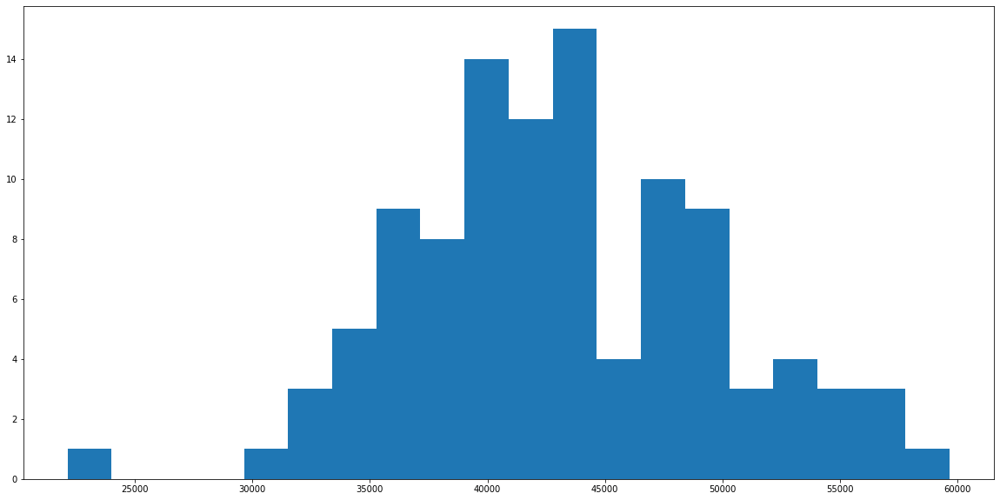

category: bishop, dataset: train


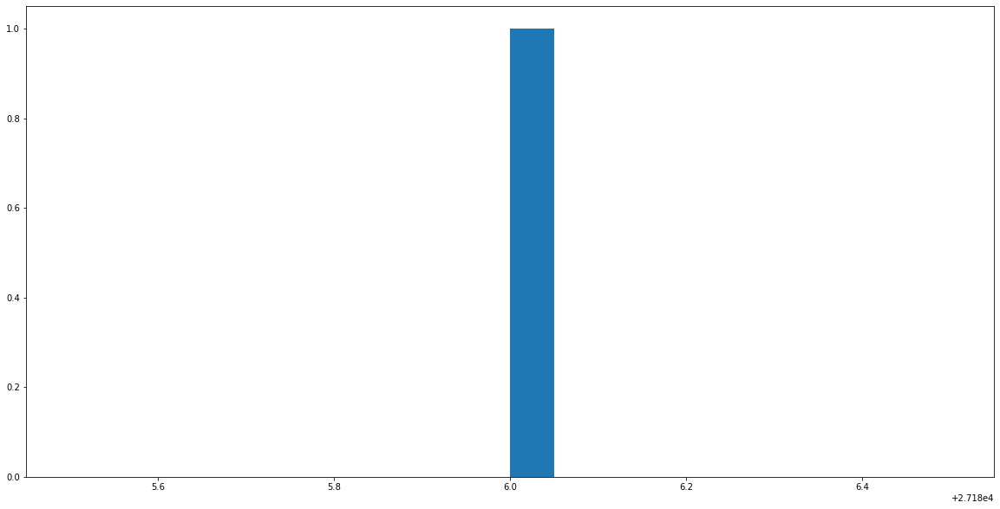

category: black-pawn, dataset: valid


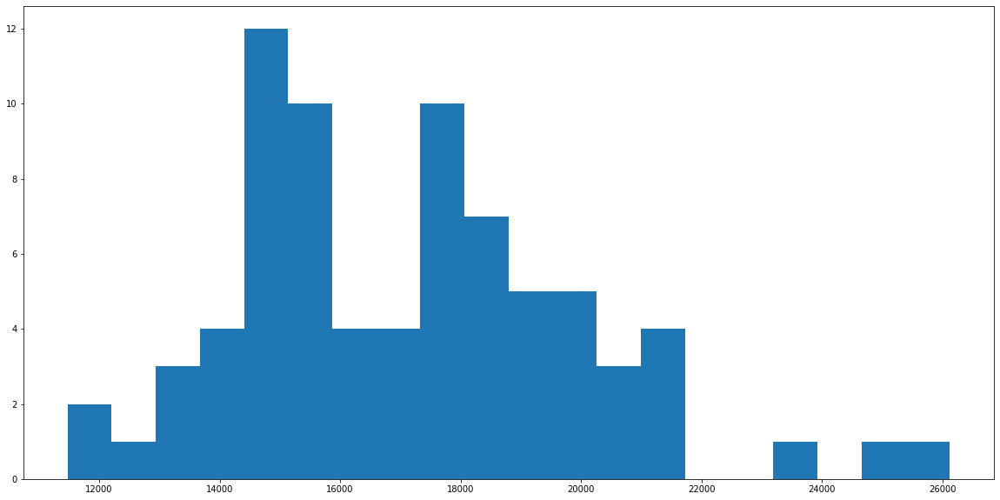

category: black-king, dataset: valid


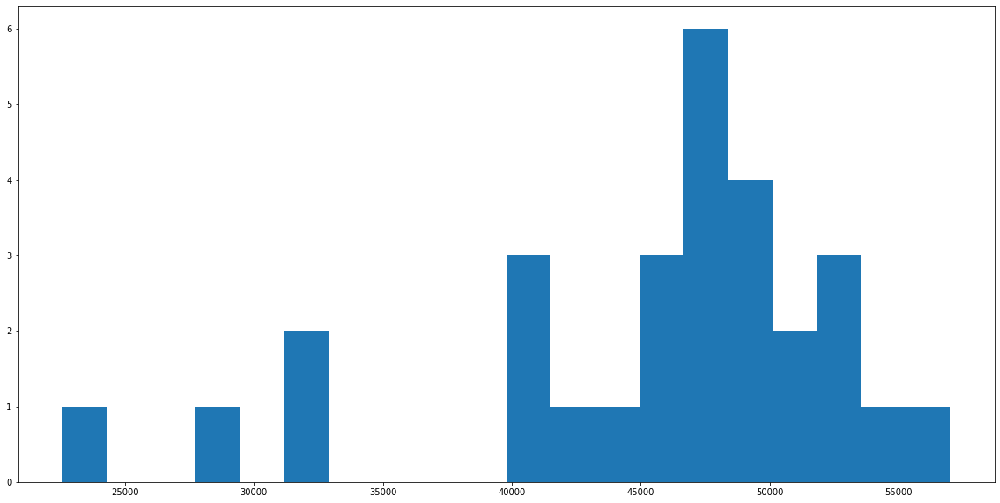

category: black-queen, dataset: valid


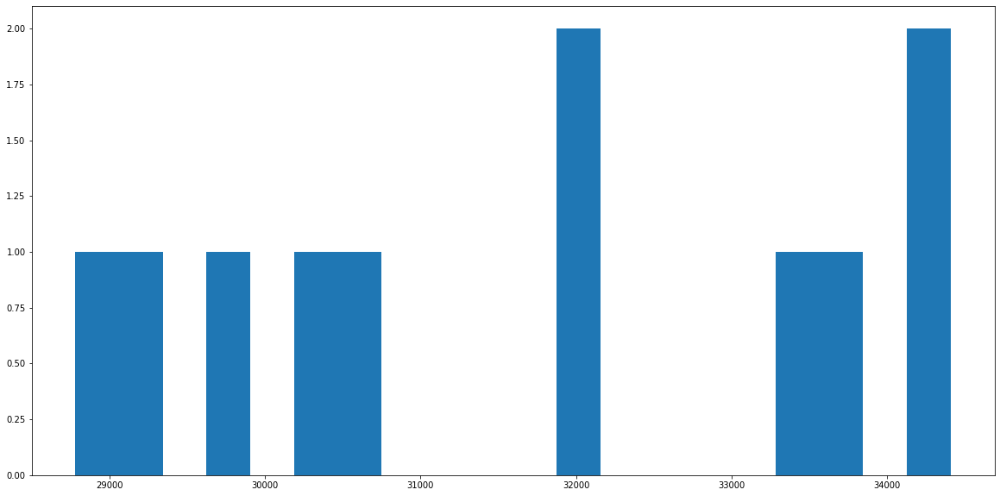

category: black-queen, dataset: test


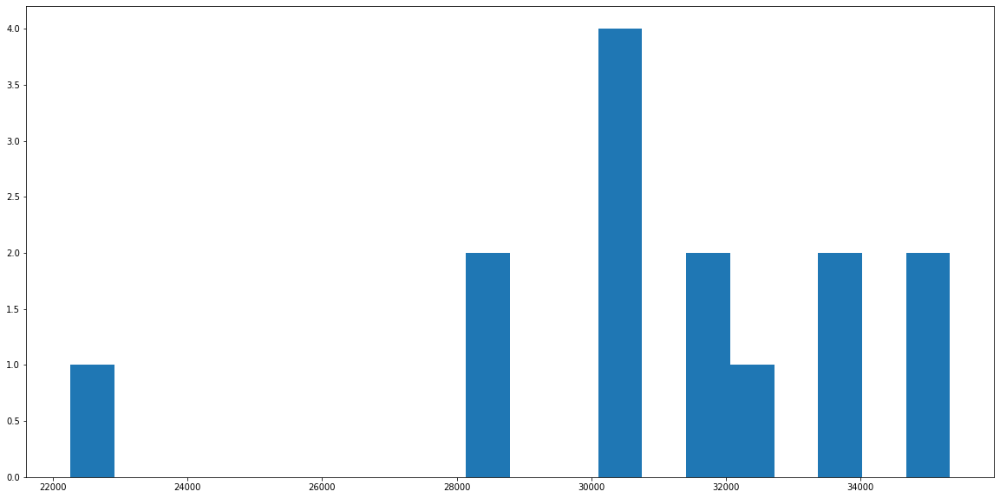

category: white-queen, dataset: test


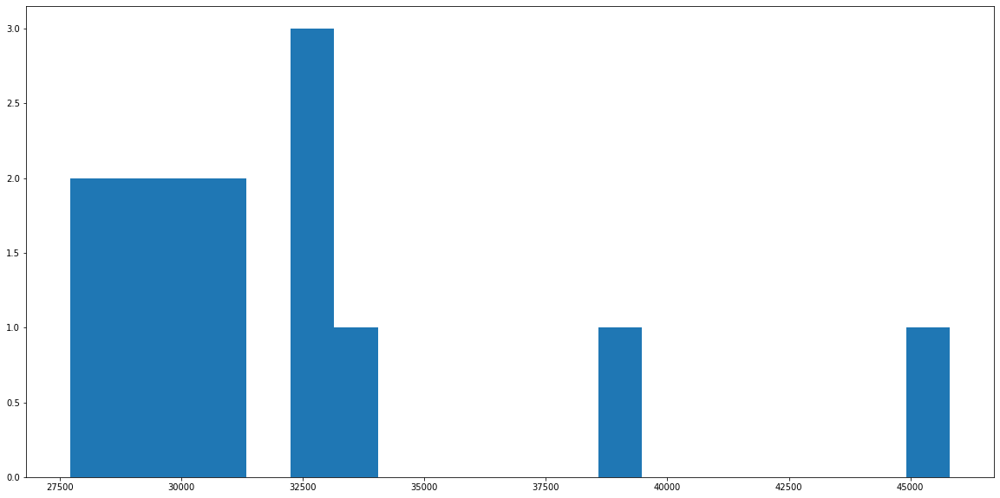

category: white-bishop, dataset: test


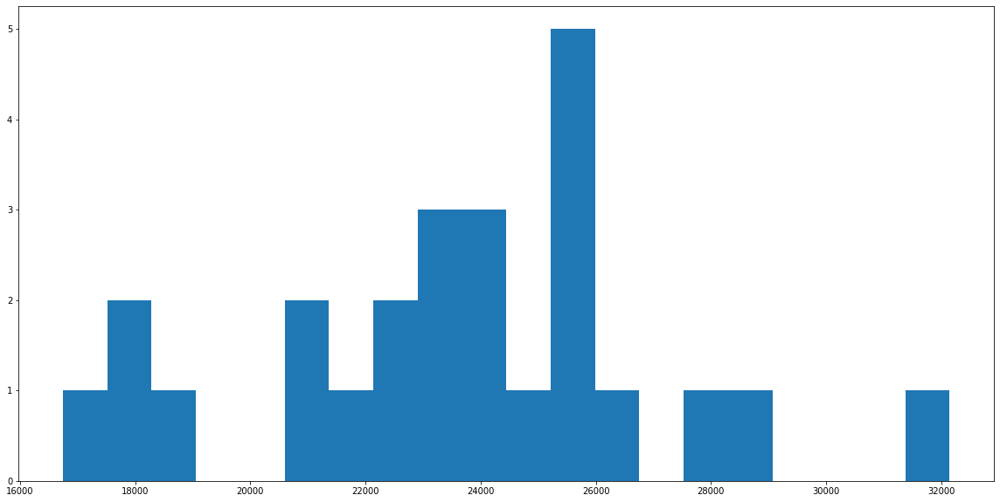

In [ ]:
for dataset in ["train", "valid", "test"]:
  tmp_data = data[data["split"]==dataset]
  for cat in sample(set(tmp_data.category.unique()), 3):
    print(f"category: {cat}, dataset: {dataset}")
    cat_area = tmp_data[tmp_data["category"]==cat].area.tolist()
    plt.hist(cat_area, bins=20)
    plt.show()

Visualize asymmetric figures to check if they are present in all of their sides/positions.

Image:


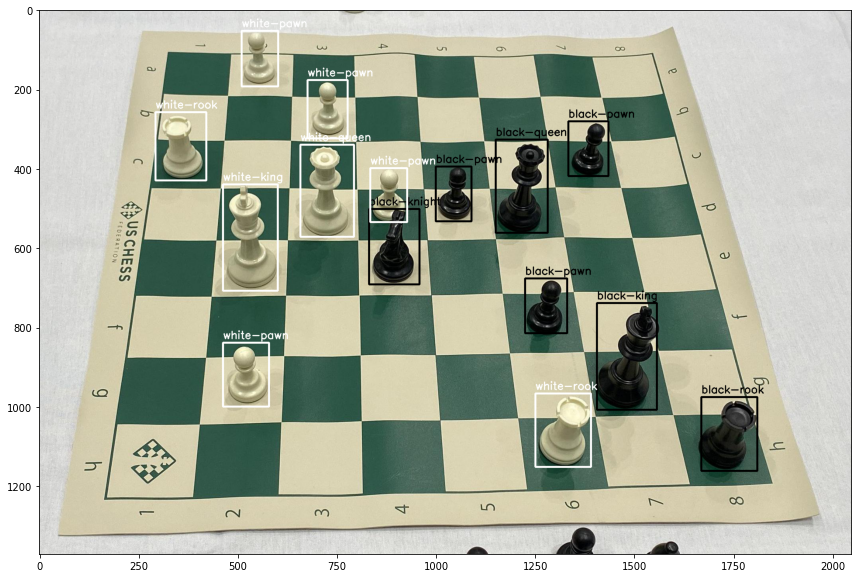

Image:


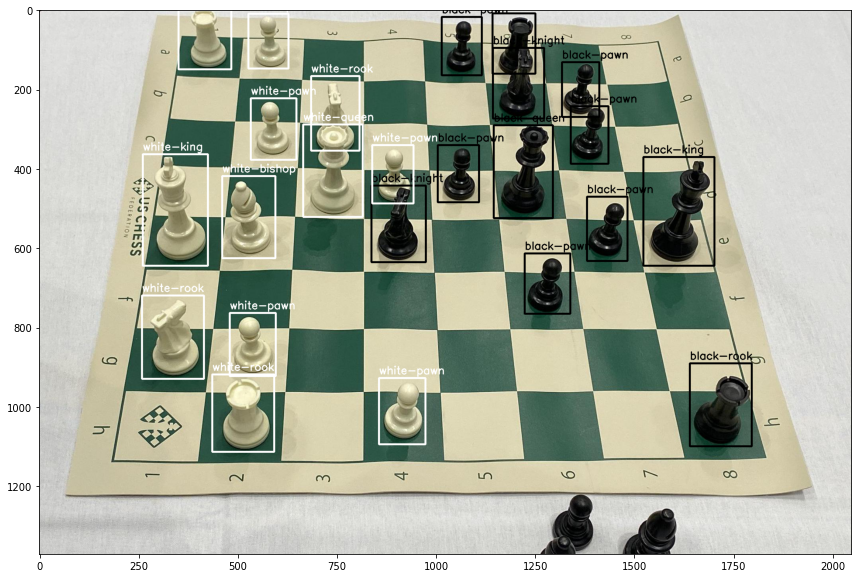

Image:


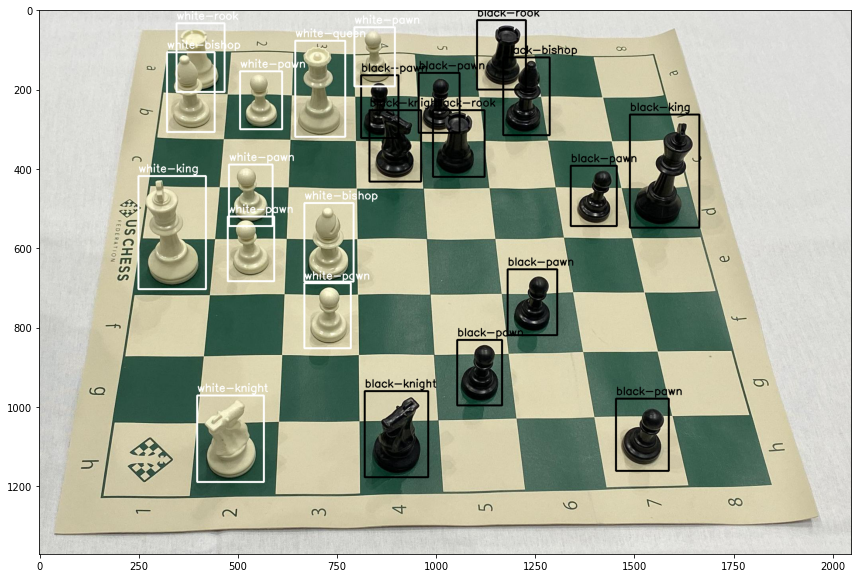

Image:


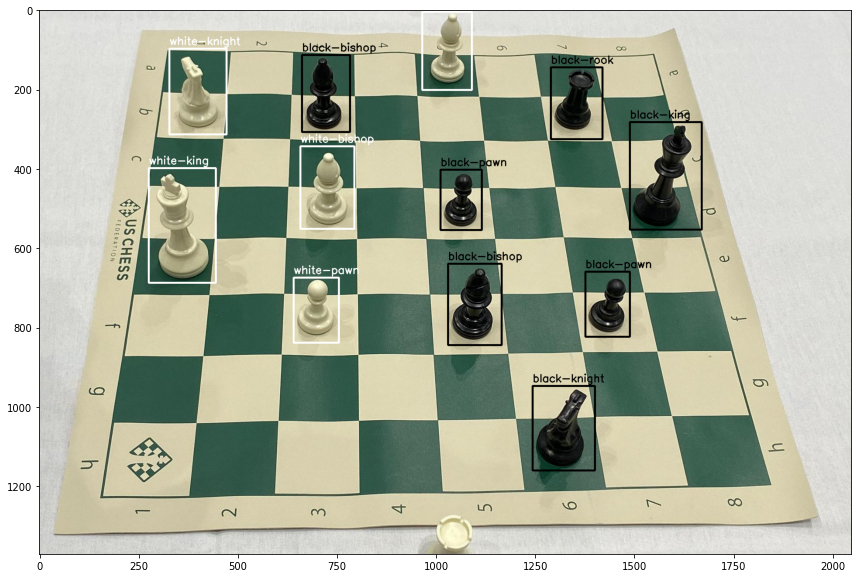

Image:


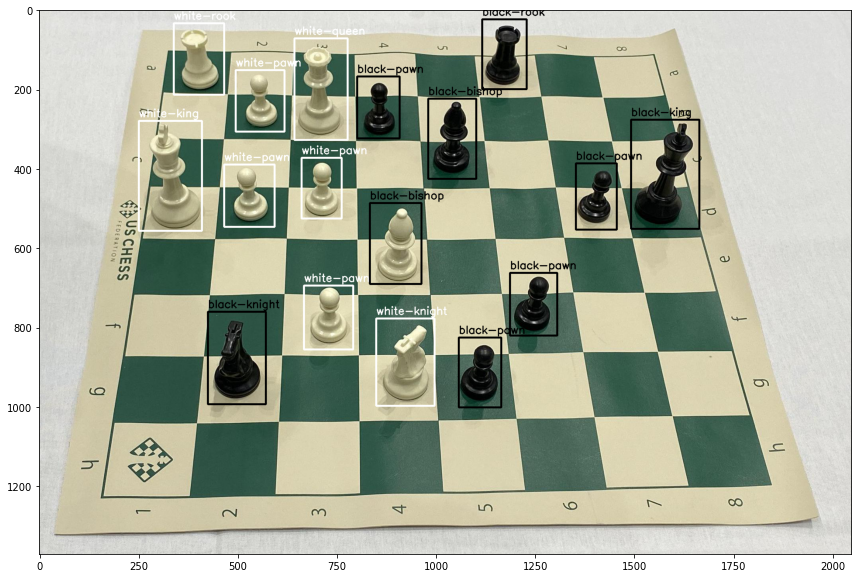

Image:


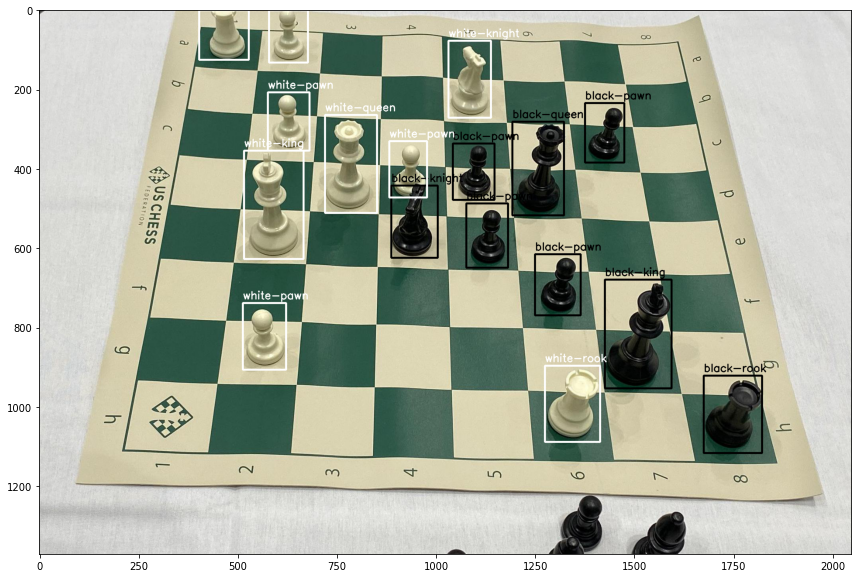

Image:


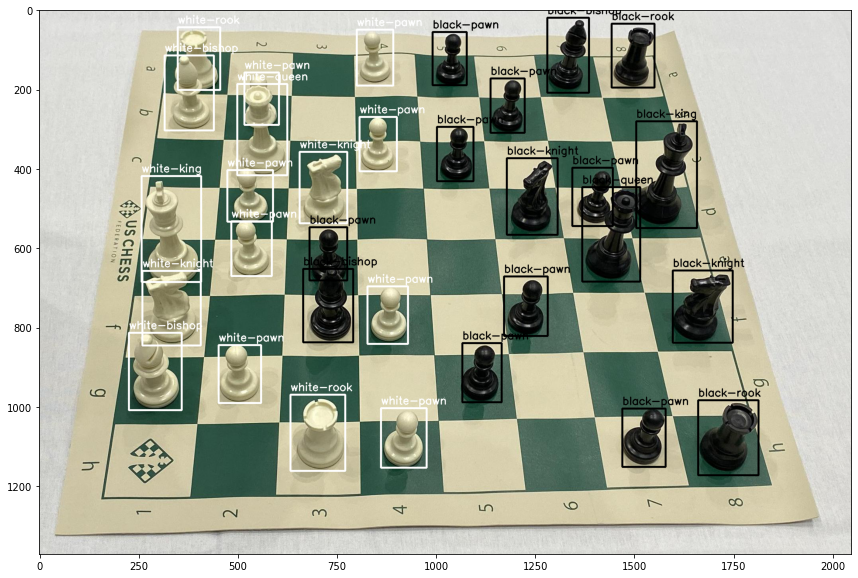

Image:


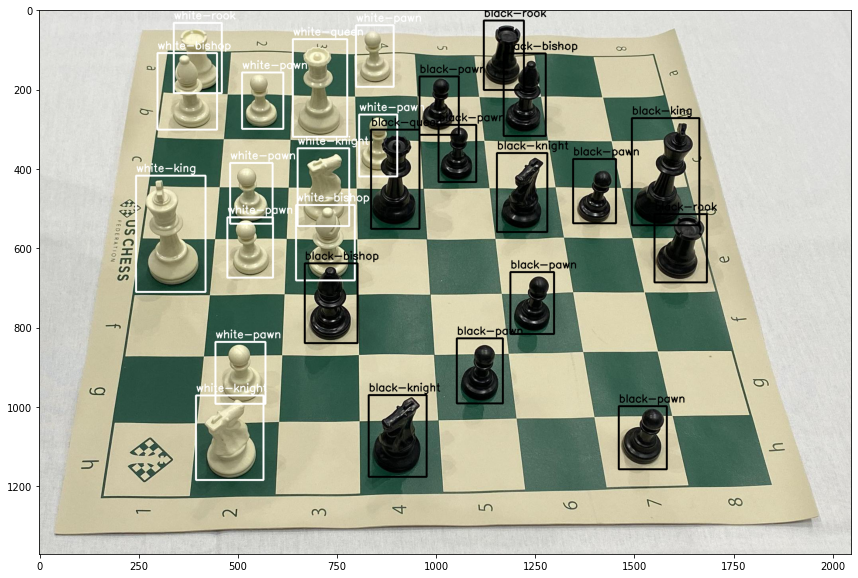

Image:


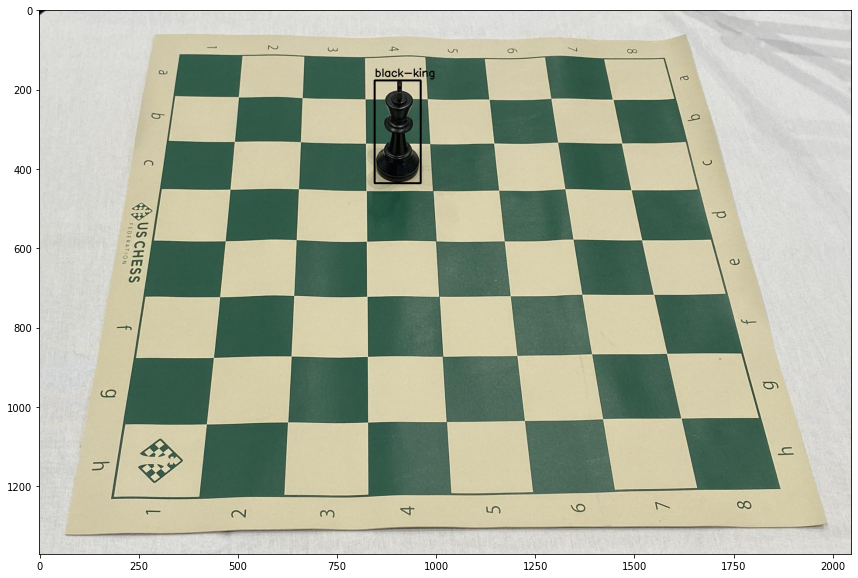

Image:


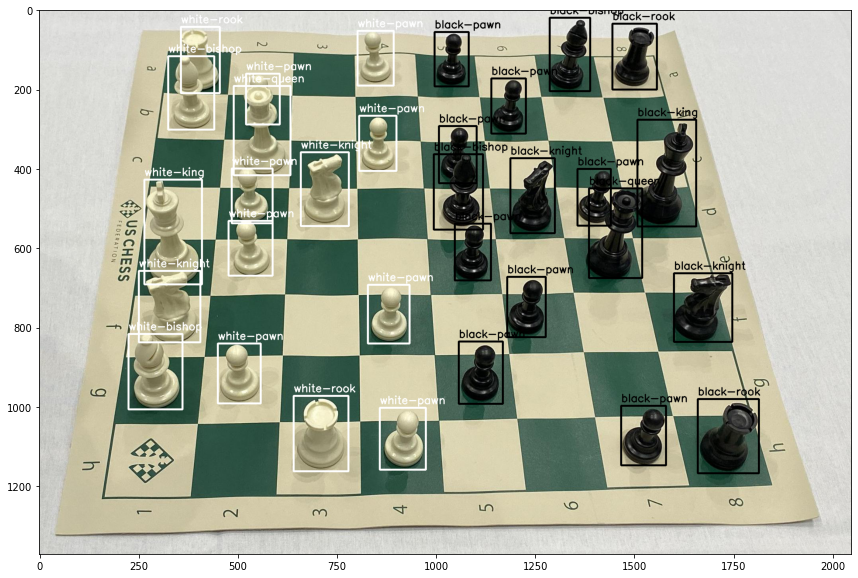

Image:


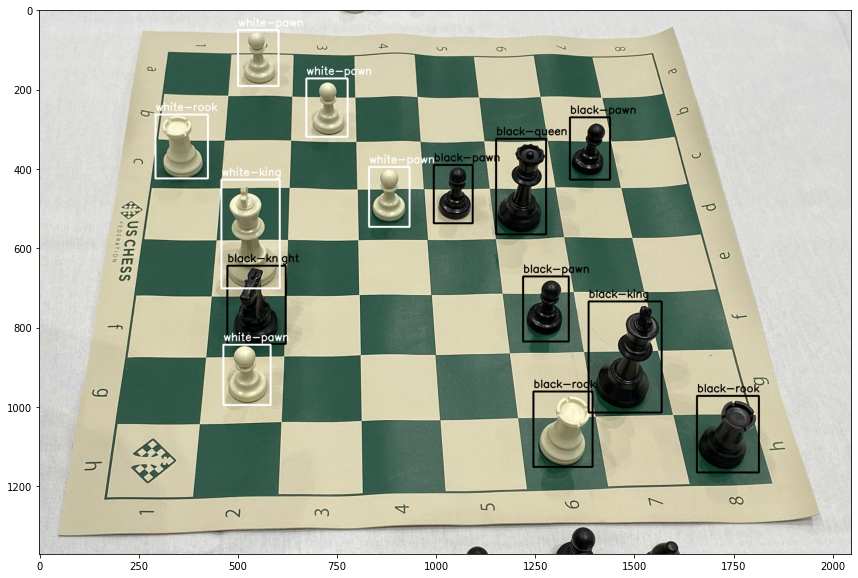

Image:


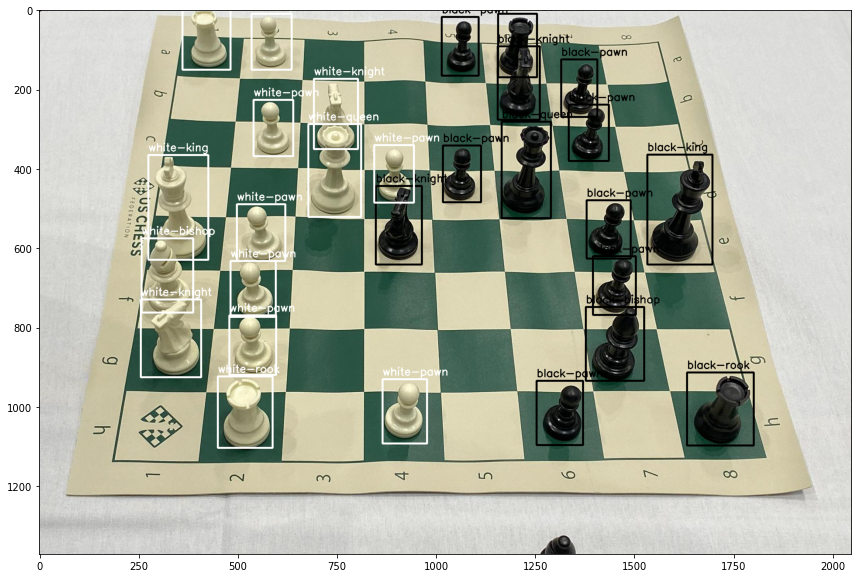

Image:


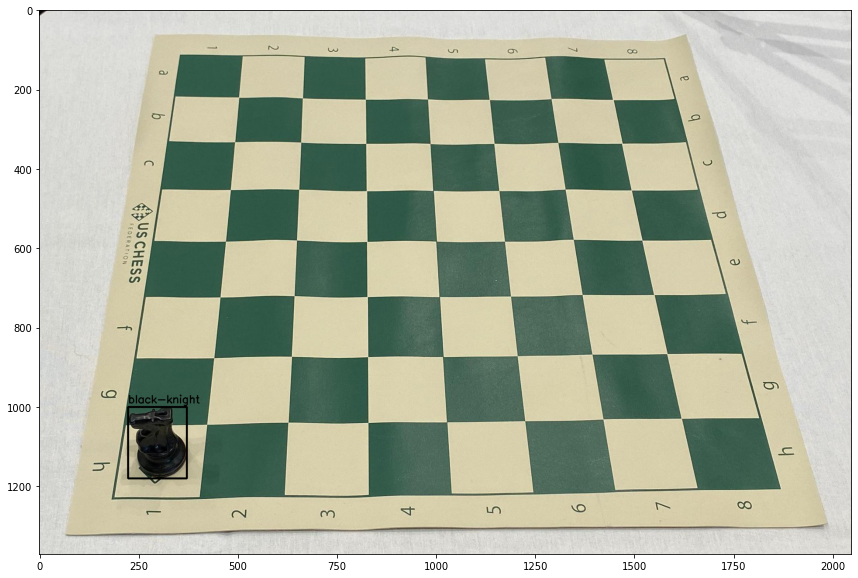

Image:


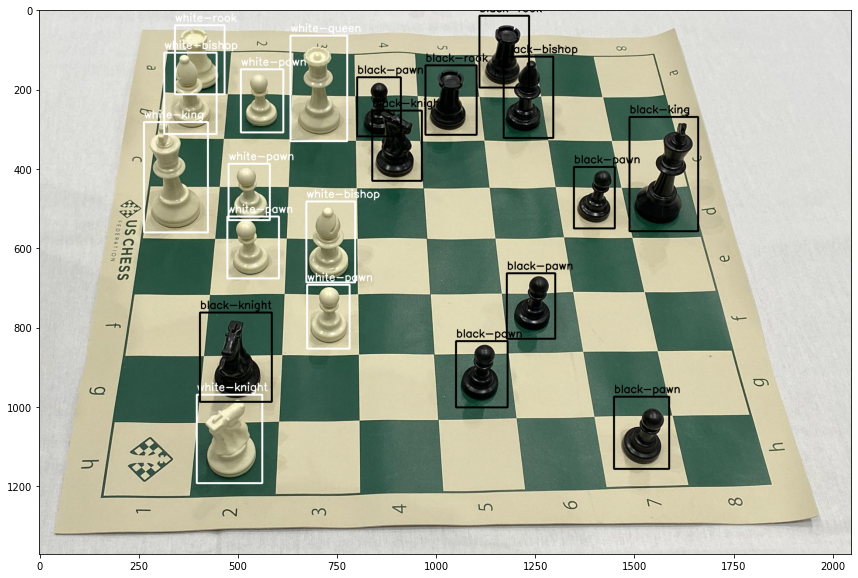

Image:


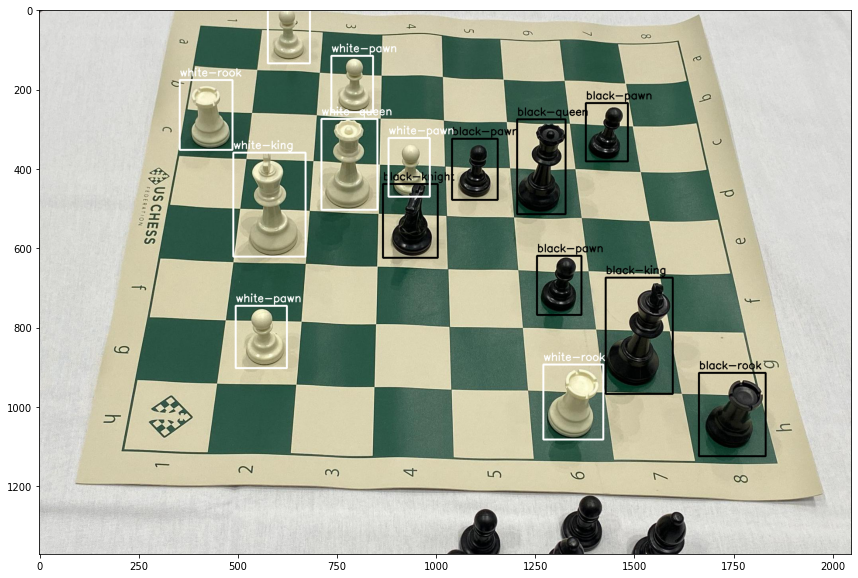

Image:


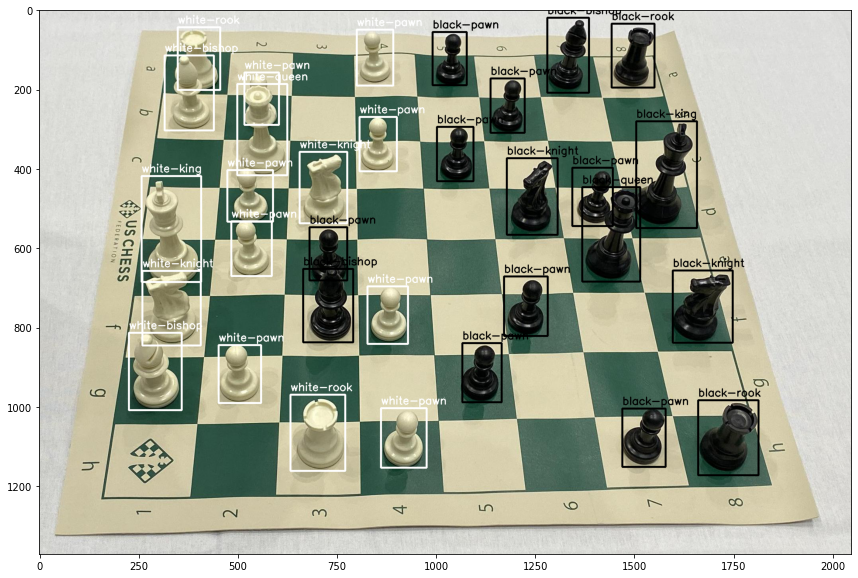

Image:


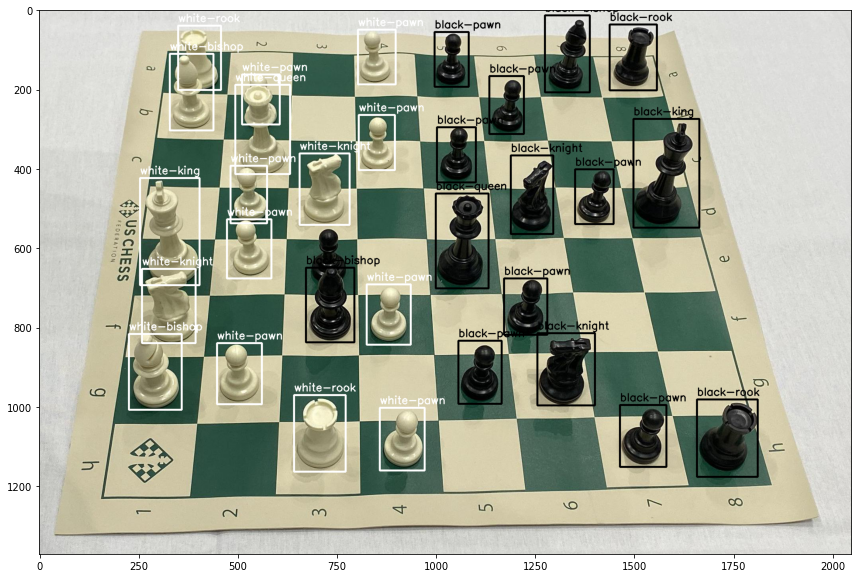

Image:


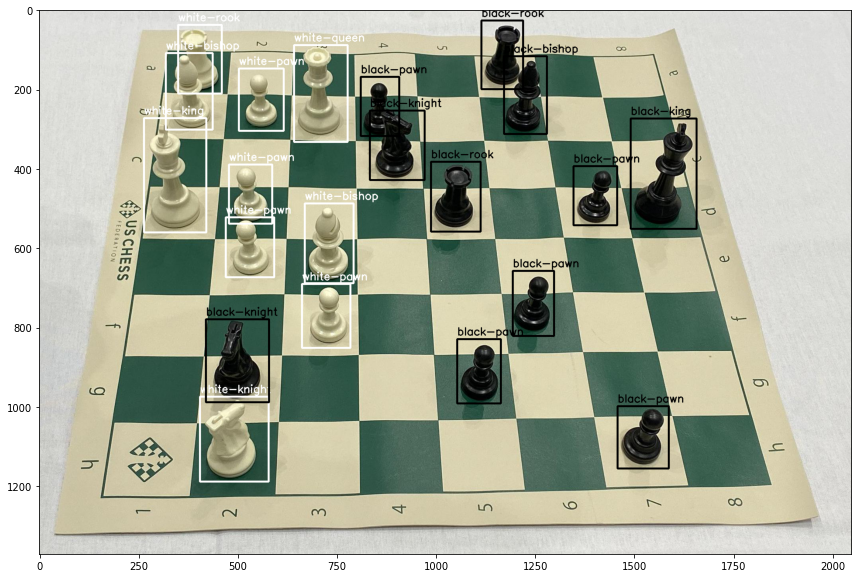

In [ ]:
asymmetric_figures = ["king", "knight"]

for figure in asymmetric_figures:
  data_slice = data[data.category.str.contains(figure)]
  for dataset in ["train", "valid", "test"]:
    ids = data_slice[data_slice.split==dataset].image_id.tolist()
    annotation_path = f'drive/MyDrive/Chess Pieces/{dataset}/_annotations.coco.json'
    image_dir = f'drive/MyDrive/Chess Pieces/{dataset}'
    chess_dataset = ChessDataset(annotation_path, image_dir)
    for id in sample(ids,3):
      chess_dataset.display_image(id)
      cv2.waitKey(1)
      plt.show()
 

Visualize each bbox position per category per dataset (train/val/test).

white-knight


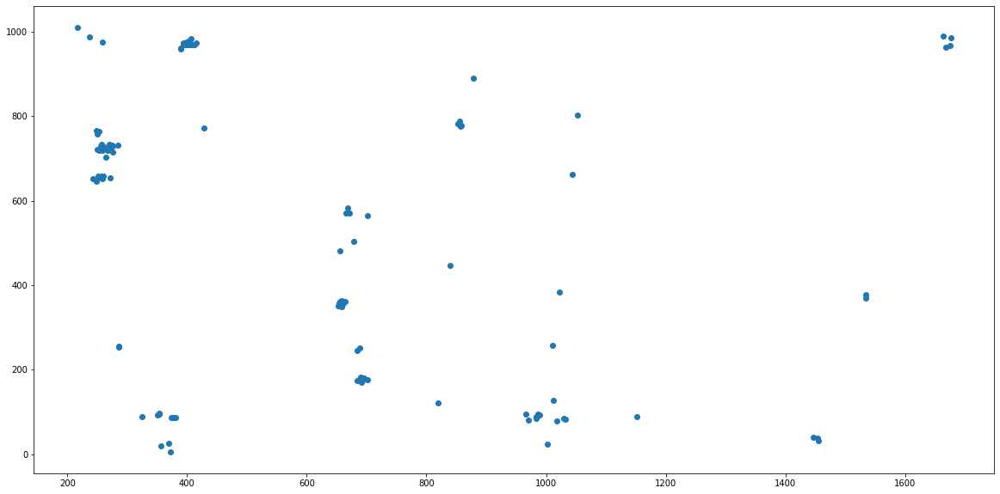

white-pawn


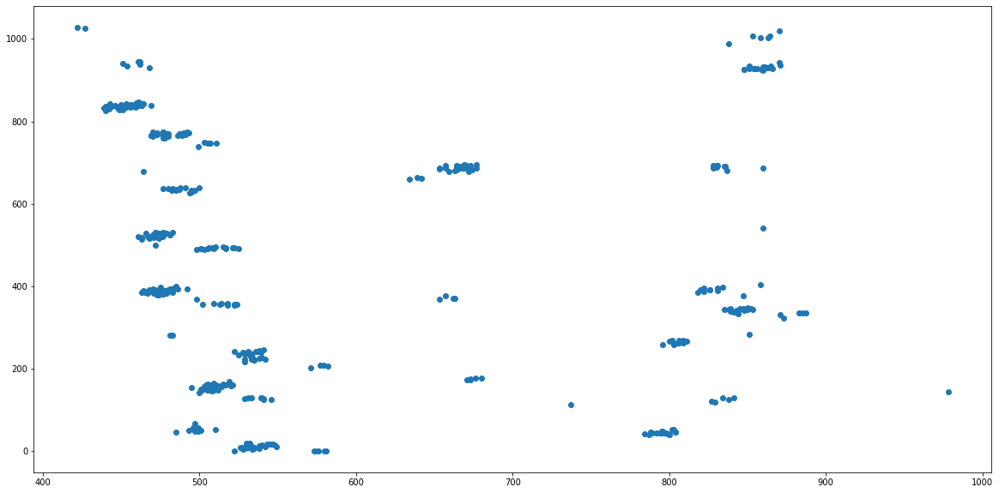

black-pawn


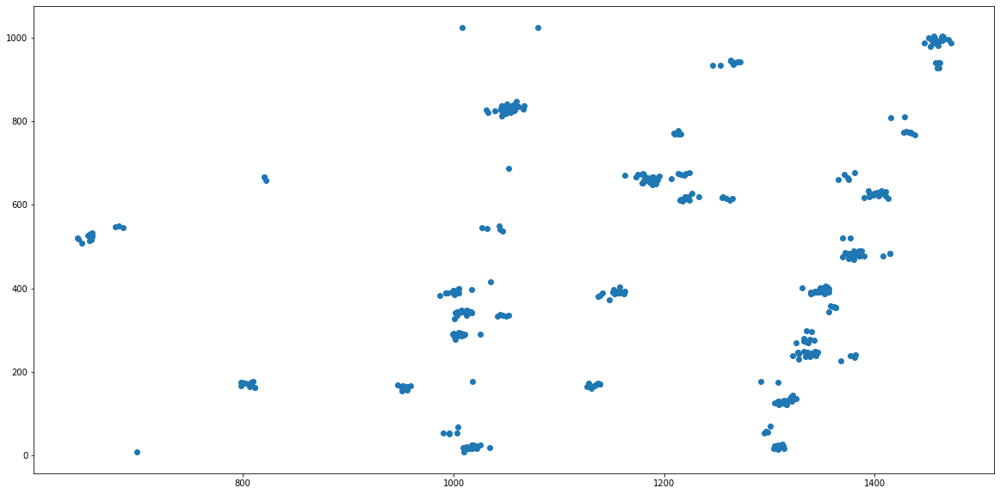

white-queen


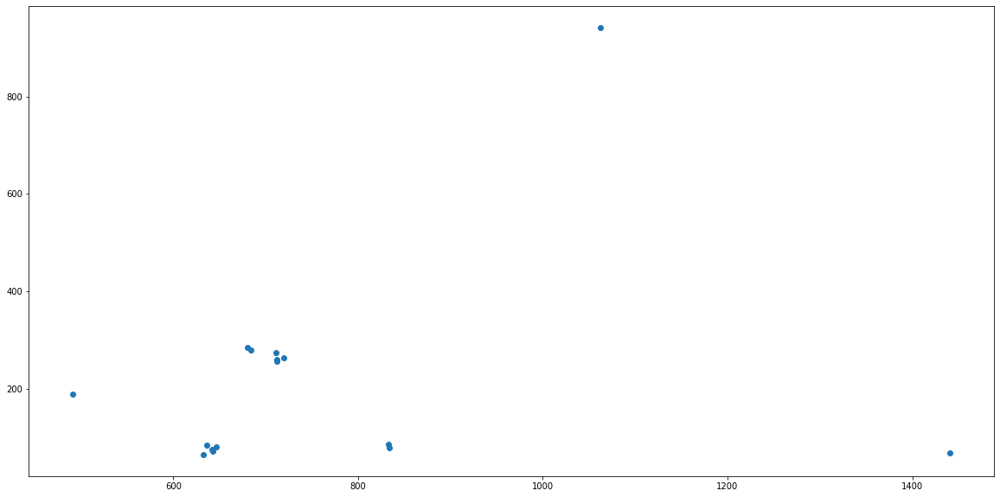

black-queen


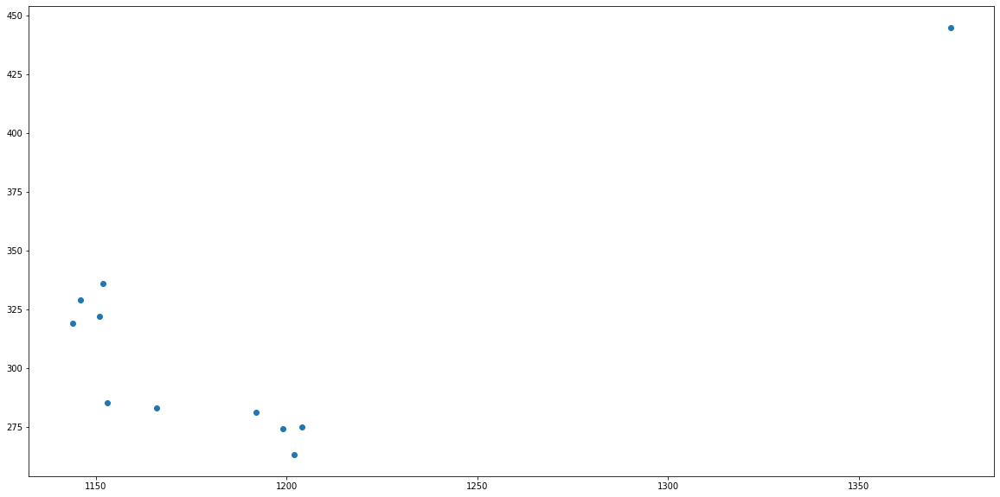

white-bishop


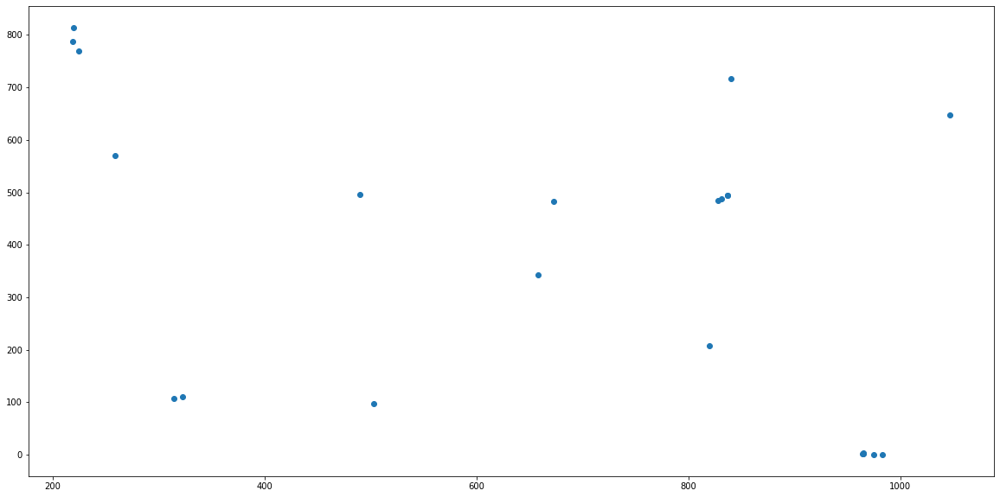

black-knight


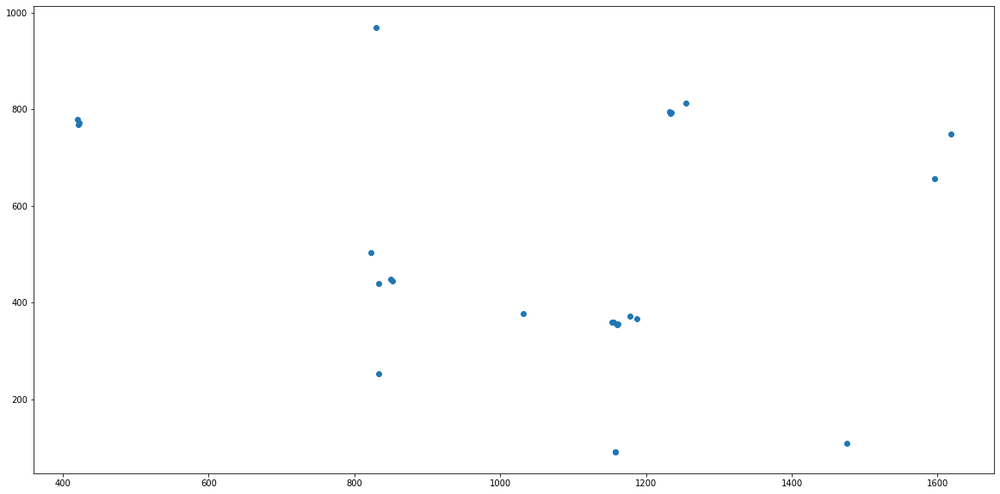

white-knight


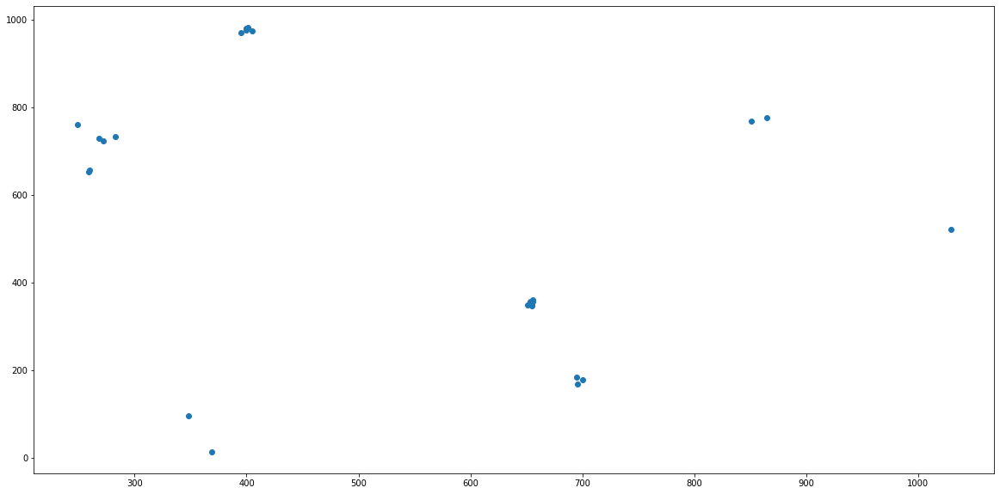

white-rook


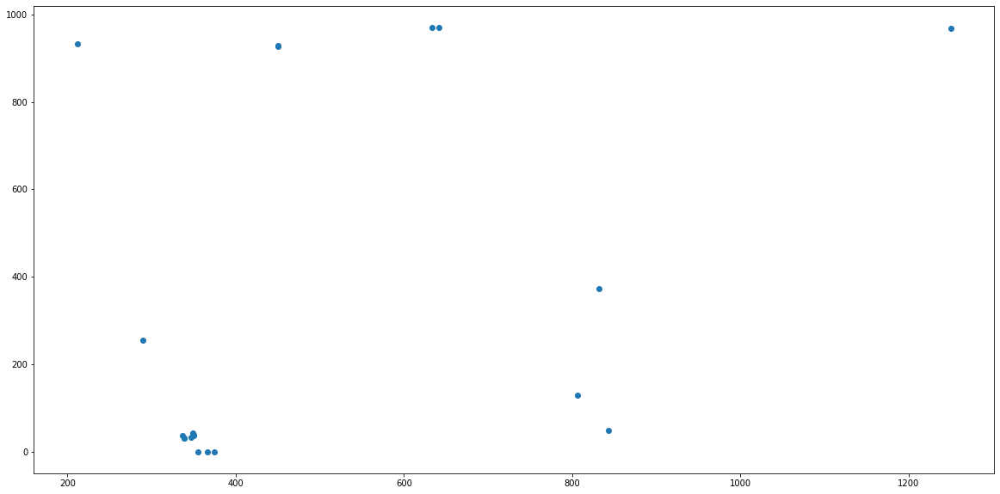

In [ ]:
for dataset in ["train", "valid", "test"]:
  data_slice = data[data.split==dataset]
  for cat in sample(set(data_slice.category.unique()),3):
    print(cat)
    plt.scatter(data_slice[data_slice.category==cat].x.tolist(), data_slice[data_slice.category==cat].y.tolist())
    plt.show()

TODO: 
1. Calculate image statistics (per channel mean and std).
2. Check model confidence per output.
3. Check different IoU results.
4. Experiment with https://github.com/slundberg/shap